In [1]:
# Install necessary libraries
!pip install torch torchvision numpy opencv-python

# Clone the YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 16936, done.
remote: Counting objects: 100% (131/131), done.
remote: Compressing objects: 100% (81/81), done.
remote: Total 16936 (delta 67), reused 91 (delta 50), pack-reused 16805 (from 1)
Receiving objects: 100% (16936/16936), 15.70 MiB | 19.84 MiB/s, done.
Resolving deltas: 100% (11600/11600), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.3/872.3 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.2 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0


In [1]:
import torch
from PIL import Image
import requests
from io import BytesIO

# Load the pre-trained YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

/usr/local/lib/python3.10/dist-packages/torch/hub.py:295: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-9-1 Python-3.10.12 torch-2.4.0+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 129MB/s] 

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


Saving car.jpg to car.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


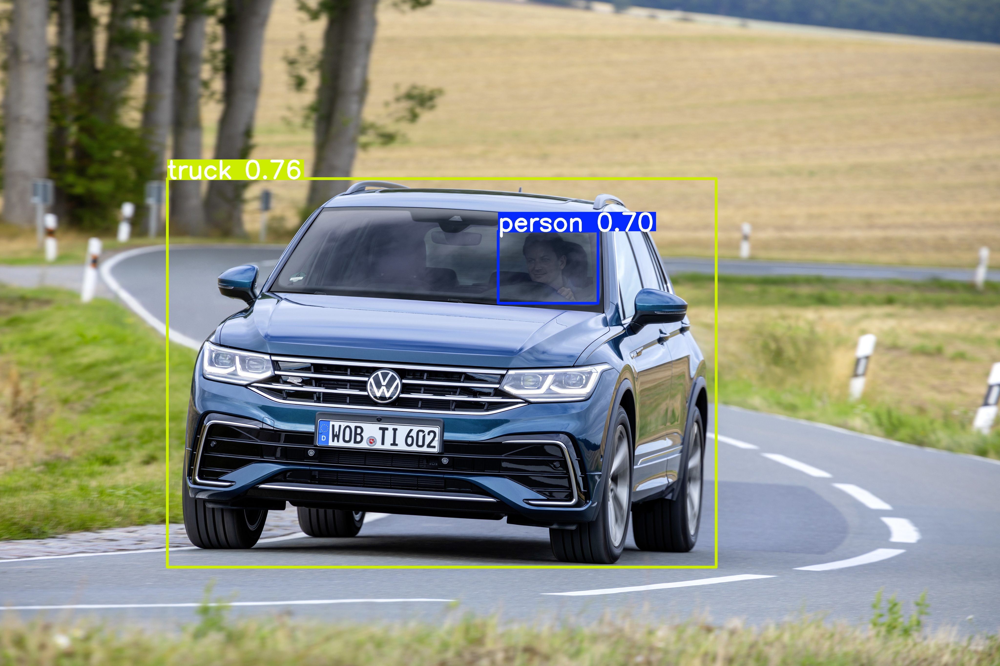

In [2]:
from google.colab import files
uploaded = files.upload()

# Load the uploaded image
image_path = list(uploaded.keys())[0]
img = Image.open(image_path)

# Perform inference
results = model(img)

# Display results
results.show()

In [9]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
# Filter results for cars only (class 'car' has index 2 in YOLOv5's COCO dataset)
car_results = results.xyxy[0][results.xyxy[0][:, 5] == 2]

# Draw bounding boxes on the original image for car detections only
draw = ImageDraw.Draw(img)

for *box, conf, cls in car_results:
    x1, y1, x2, y2 = box
    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
    draw.text((x1, y1), f"Car {conf:.2f}", fill="red")

# Display the image using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

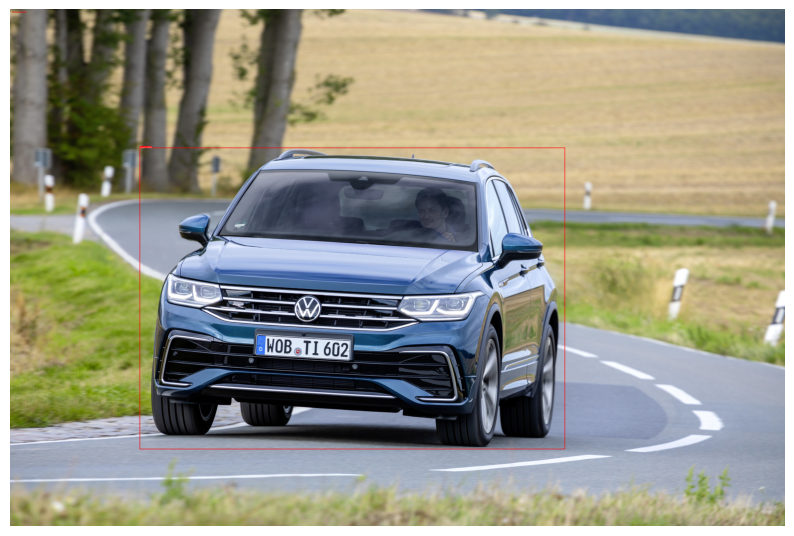

Number of vehicles detected: 1
Truck 1: Confidence: 75.90% | Bounding Box: [685.8013, 732.68243, 2933.6274, 2325.9644]


In [24]:
from PIL import Image, ImageDraw, ImageFont
# Convert results to numpy array for easier filtering
detections = results.xyxy[0].cpu().numpy()

# Filter results for cars and trucks (class 'car' is 2, 'truck' is 7 in YOLOv5's COCO dataset)
vehicle_classes = {2: "Car", 7: "Truck"}
filtered_detections = [d for d in detections if int(d[5]) in vehicle_classes]

# Draw bounding boxes and additional details on the image
draw = ImageDraw.Draw(img)

# Load a font for text rendering
try:
    font = ImageFont.truetype("arial.ttf", 15)
except IOError:
    font = ImageFont.load_default()

if len(filtered_detections) > 0:
    for *box, conf, cls in filtered_detections:
        x1, y1, x2, y2 = box
        vehicle_type = vehicle_classes[int(cls)]
        draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
        text = f"{vehicle_type} {conf:.2%}"
        # Use textbbox to get the size of the text
        text_bbox = draw.textbbox((x1, y1 - 20), text, font=font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]
        draw.rectangle([x1, y1 - text_height, x1 + text_width, y1], fill="red")
        draw.text((x1, y1 - text_height), text, fill="white", font=font)
else:
    draw.text((10, 10), "No cars or trucks detected", fill="red", font=font)

# Display the image using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

# Print detailed detection information
if len(filtered_detections) > 0:
    print(f"Number of vehicles detected: {len(filtered_detections)}")
    for i, (*box, conf, cls) in enumerate(filtered_detections, 1):
        vehicle_type = vehicle_classes[int(cls)]
        print(f"{vehicle_type} {i}: Confidence: {conf:.2%} | Bounding Box: {box}")
else:
    print("No cars or trucks detected.")

In [22]:
%matplotlib inline